In [ ]:
# /homes/iws/emazuh/.local/lib/python3.6/site-packages

In [ ]:
# TODO
# load model and example (plus labels and test you can get inference result)

# Hypothesis to test
# 1. Some feature maps per layer specialize on certain objects (ie for a given object, 
#   there is a set of feature maps useful for extracting identifying information
#   and some that are not applicable)
# 2. Within a feature map in a layer, there are "pixels" not useful for a given 
#   task and can be set to zero (since the activations they are low values and
#   can be set to zero with little loss of accuracy - but exploited for sparsity)

In [1]:
import os
import torch
from torchvision import datasets, transforms
import torchvision.models as models
import numpy as np
from matplotlib import pyplot as plt

In [4]:
os.environ['TORCH_HOME'] = '/local1/emazuh/pytorch-playground/script/imagenet-data/pretrained'

In [5]:
vgg16 = models.vgg16(pretrained=True)
vgg16.eval()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /local1/emazuh/pytorch-playground/script/imagenet-data/pretrained/hub/checkpoints/vgg16-397923af.pth


In [7]:
# get the activations
activation = {}
def getActivation(name):
    # the hook signature
    def hook(model, input, output):
        activation[name] = output.detach()
    
    return hook

hooks = []
names = []
features = vgg16.features
for i in range(len(features)):
    feature = features[i]
    name = feature._get_name() + "_" + str(i)
    names.append(name)
    
    hooks.append(feature.register_forward_hook(getActivation(name)))

avgpool = vgg16.features
hooks.append(avgpool.register_forward_hook(getActivation('avgpool')))
names.append('avgpool')
classifier = vgg16.classifier
for i in range(len(classifier)):
    c = classifier[i]
    name = c._get_name() + "_" + str(i)
    names.append(name)
    
    hooks.append(feature.register_forward_hook(getActivation(name)))

In [ ]:

for hook in hooks:
    hook.remove()

In [ ]:
# categories https://image-net.org/challenges/LSVRC/2012/browse-synsets.php

In [8]:
data = "/local1/emazuh/pytorch-playground/script/imagenet-data"
# valdir = os.path.join(data, 'val224.pkl')
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            normalize,
        ])
dataset = datasets.ImageNet(data, split="val", transform=transform)
batch_size = 1
workers = 0
val_loader = torch.utils.data.DataLoader(
        dataset,
        batch_size=batch_size, shuffle=False,
        num_workers=workers, pin_memory=True)

In [9]:
samples = []
for idx, dat in enumerate(val_loader):
    samples.append(dat)
    if idx >= 1000:
        break

In [ ]:
# Visualize data

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


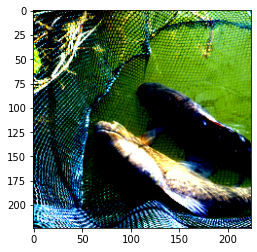

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


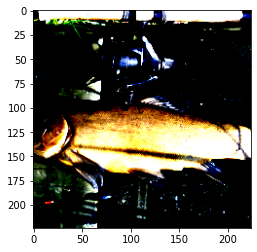

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


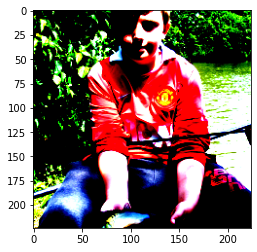

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


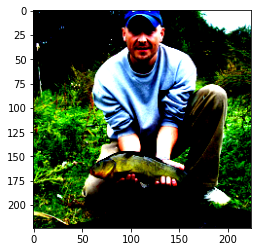

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


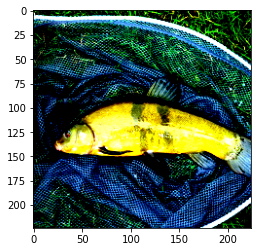

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


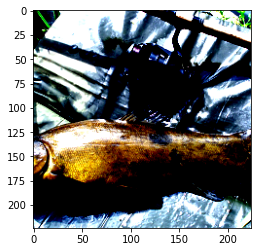

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


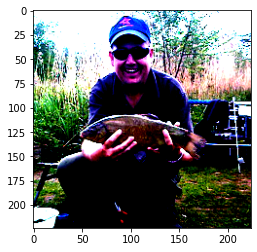

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


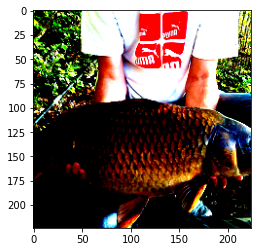

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


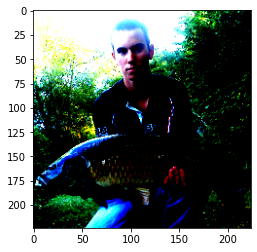

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


('tench', 'Tinca tinca')


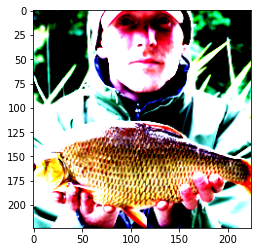

In [13]:
for i in range(0, 10):
    d = samples[i]
    print(dataset.classes[d[1]])
    plt.imshow(  d[0].squeeze(0).permute(1, 2, 0))
    plt.show()

In [67]:
test_activations = []

In [59]:
import copy

In [119]:
# Test model can get some predictions right [done]
for i in range(500):
    dt = samples[i]
#     print('expected', dataset.classes[dt[1].item()])
    o = vgg16(dt[0])
#     print('got', dataset.classes[o.argmax().item()])
    test_activations.append(copy.deepcopy(activation))

In [19]:
len(activation)

38

In [20]:
activation.keys()

dict_keys(['Conv2d_0', 'ReLU_1', 'Conv2d_2', 'ReLU_3', 'MaxPool2d_4', 'Conv2d_5', 'ReLU_6', 'Conv2d_7', 'ReLU_8', 'MaxPool2d_9', 'Conv2d_10', 'ReLU_11', 'Conv2d_12', 'ReLU_13', 'Conv2d_14', 'ReLU_15', 'MaxPool2d_16', 'Conv2d_17', 'ReLU_18', 'Conv2d_19', 'ReLU_20', 'Conv2d_21', 'ReLU_22', 'MaxPool2d_23', 'Conv2d_24', 'ReLU_25', 'Conv2d_26', 'ReLU_27', 'Conv2d_28', 'ReLU_29', 'MaxPool2d_30', 'Linear_0', 'Dropout_2', 'Linear_3', 'ReLU_4', 'Dropout_5', 'Linear_6', 'avgpool'])

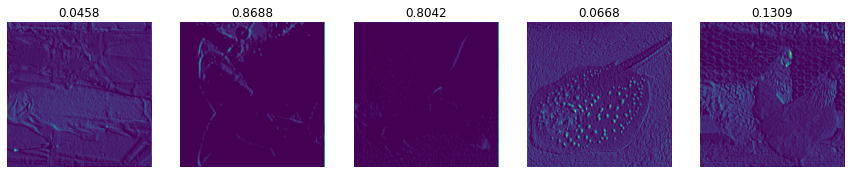

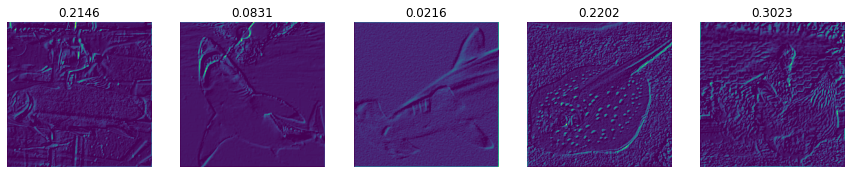

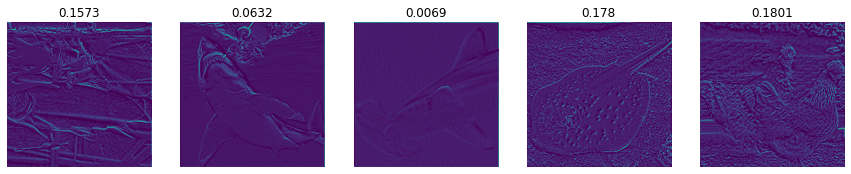

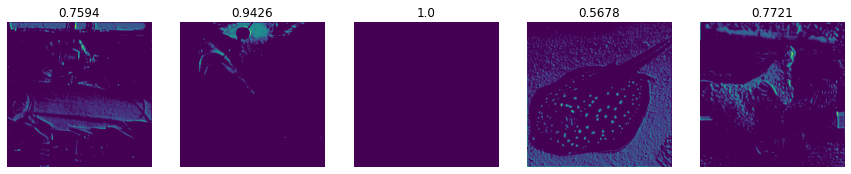

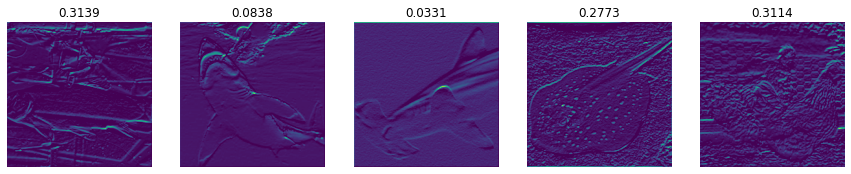

...

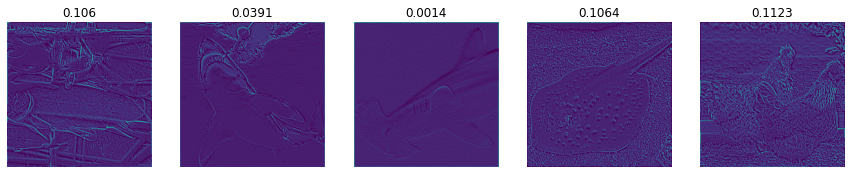

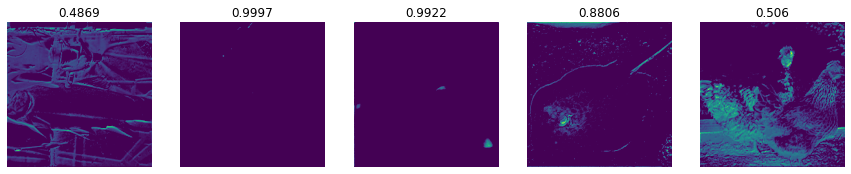

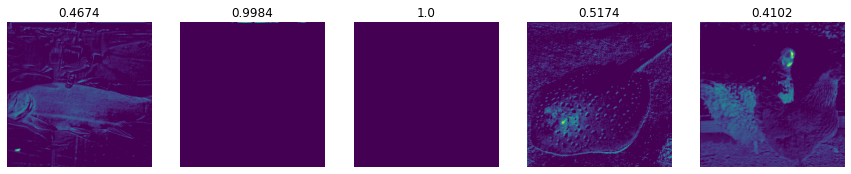

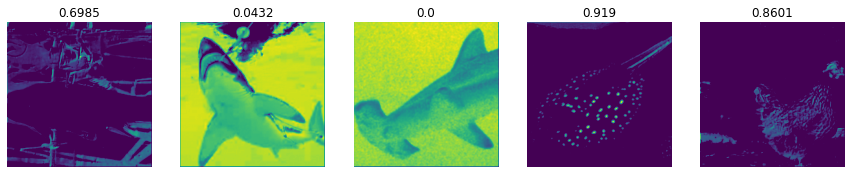

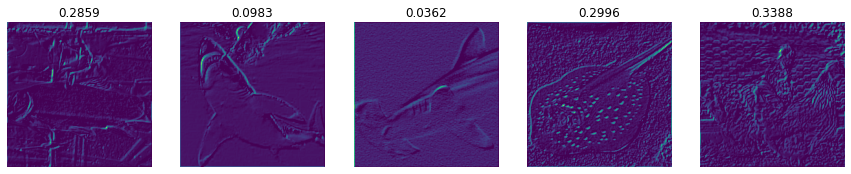

In [78]:
# f, axarr = plt.subplot(1,4)
for i in range(64):
    plt.figure(figsize=(15,25)) 
    for j in range(5):
        plt.subplot(1,5,j+1)
    #     axarr[0,i].imshow(activation['Conv2d_0'][0][i])
        img = test_activations[j]['Conv2d_0'][0][i].detach().numpy()
        plt.imshow(img)
        plt.title(np.round((img < 1e-32).mean(), 4))
        plt.axis('off')
    plt.show()

In [81]:
activation['Conv2d_0'][0].shape

torch.Size([64, 224, 224])

In [84]:
def plot_filters(act_list, layer_name='Conv2d_0', n_obj=5):
    N = act_list[0][layer_name].shape[1]
    print(N)
    for i in range(N):
        plt.figure(figsize=(15,25)) 
        for j in range(n_obj):
            plt.subplot(1,n_obj,j+1)
        #     axarr[0,i].imshow(activation['Conv2d_0'][0][i])
            img = act_list[j][layer_name][0][i].detach().numpy()
            plt.imshow(img)
            plt.title(np.round((img < 1e-32).mean(), 4))
            plt.axis('off')
        plt.show()

512


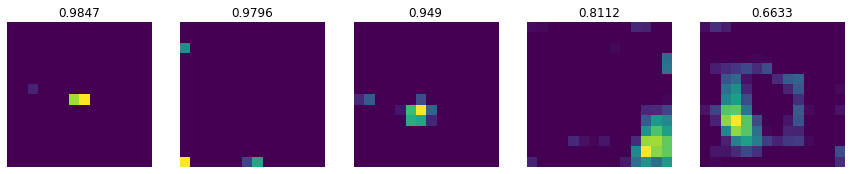

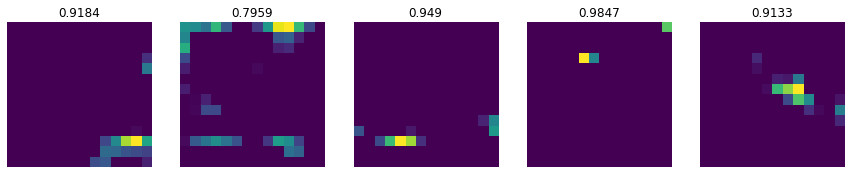

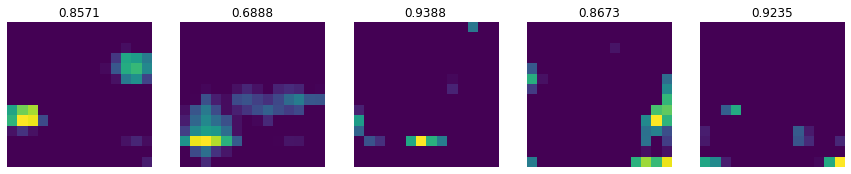

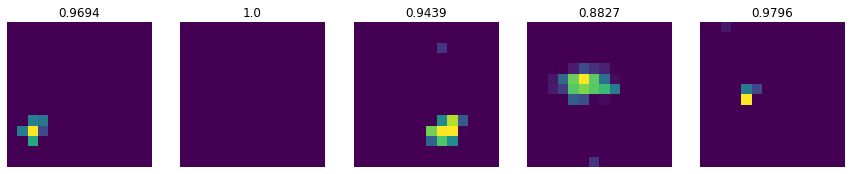

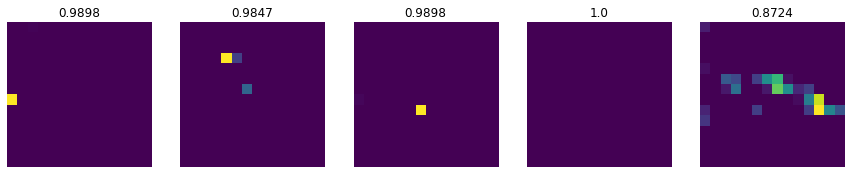

...

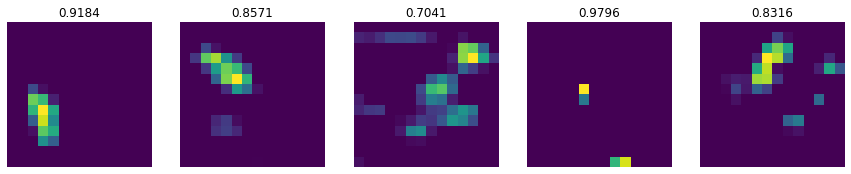

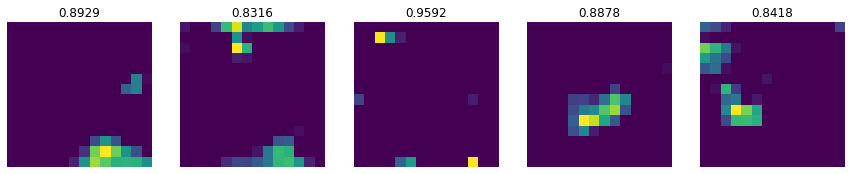

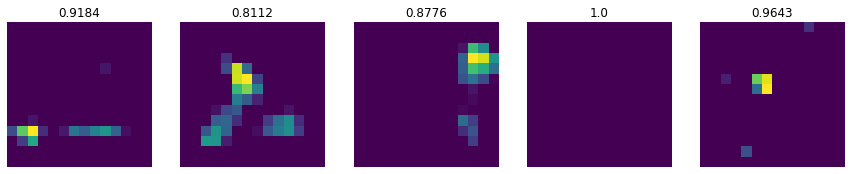

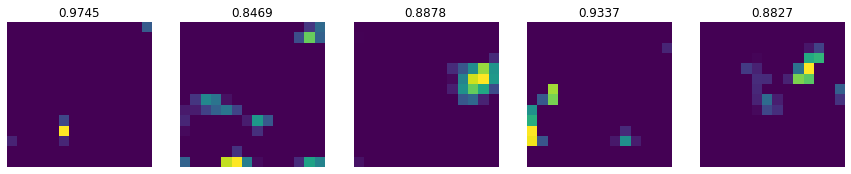

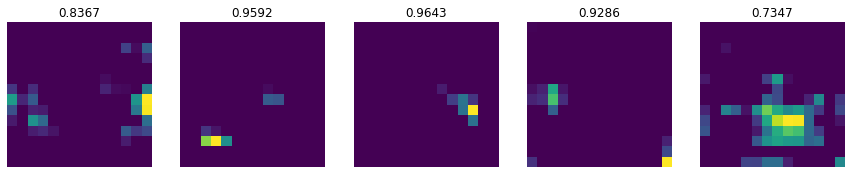

In [88]:
plot_filters(test_activations, layer_name='Conv2d_28')

In [22]:
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# What we have
# Eg: activations_per_layer

In [102]:
'Conv' in list(test_activations[0].keys())[0]

True

In [124]:
feats = []
for j in range(len(test_activations)):
    n_zeros = []

    eg = test_activations[j]
    for k in eg.keys():
        if 'Conv' in k:
            l = eg[k].squeeze(0)
            N = l.shape[0]
            for i in range(N):
                img = l[i].detach().numpy()
                n_zeros.append((img < 1e-32).mean() > 0.99)

    feats.append(n_zeros)

In [125]:
print(len(feats))

505


In [118]:
print([np.mean(n)*len(n) for n in feats])

[85.0, 129.0, 260.0, 185.0, 74.0]


In [126]:
from sklearn.cluster import KMeans

In [127]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(feats[5:])

In [135]:
kmeans.labels_[200:300]

array([4, 3, 3, 3, 4, 4, 3, 0, 4, 3, 0, 4, 3, 3, 3, 4, 3, 4, 3, 4, 4, 3,
       3, 3, 3, 3, 3, 3, 3, 0, 0, 3, 4, 3, 4, 2, 2, 4, 3, 4, 0, 0, 2, 3,
       3, 2, 4, 3, 3, 3, 0, 0, 4, 0, 4, 0, 4, 0, 0, 0, 4, 3, 4, 0, 0, 4,
       2, 4, 0, 0, 0, 0, 0, 3, 0, 0, 2, 0, 0, 0, 0, 4, 0, 4, 0, 0, 0, 4,
       0, 0, 0, 4, 4, 4, 4, 0, 0, 0, 4, 4], dtype=int32)

In [93]:
n_zeros = np.array(n_zeros)

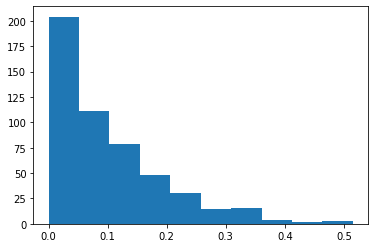

In [96]:
plt.hist(1-n_zeros)
plt.show()

In [ ]:
# count number of filters

In [ ]:
#total number of filters

In [ ]:
# Use this to rank the pruning process https://jacobgil.github.io/deeplearning/pruning-deep-learning

In [ ]:
# plot some stats ()
# For each layer, grab the filters with 100% zeros and note their filter number (layer, f_id)
# Cluster images based on this signal

# Also figure out if you can change the activation value before sending to next layer 
# so you can clip the min # of zeros

In [ ]:
# Get validation accuracy (only do experiments on correctly labelled )